# CS585 Problem Set 1 (Total points: 50 + 5 bonus)

Assignment adapted from A. Efros and Daniel McKee.

### Instructions

1.  Assignment is due at **11:59 PM on Tuesday Feb 11th 2025**.

2.  Submission instructions:

    1.  A single `.pdf` report that contains your work for Q1, Q2 and
        Q3. For Q1 and Q2 you can either type out your responses in LaTeX, or
        any other word processing software.  You can also hand write them on a
        tablet, or scan in hand-written answers. If you hand-write, please make
        sure they are neat and legible. If you are scanning, make sure that the
        scans are legible. Lastly, convert your work into a `PDF`.

        For Q3 your response should be electronic (no handwritten responses
        allowed). You should respond to the questions 3.1, 3.2 and 3.3
        individually and include images as necessary. Your response to Q3 in
        the PDF report should be self-contained. It should include all the
        output you want us to look at. You will not receive credit for any
        results you have obtained, but failed to include directly in the PDF
        report file.

        PDF file should be submitted to
        [Gradescope](https://www.gradescope.com) under `PS1`. Please tag the reponses in your PDF with the Gradescope
        questions outline  as described in
        [Submitting an Assignment](https://youtu.be/u-pK4GzpId0).

    2.  You also need to submit Pyhton code for Q3 in the form of a single
        `.py` file that includes all your code, all in the same
        directory. You can convert this notebook to Python code by
        downloading the `.ipynb` file as Python(`.py`). Code should also be submitted to
        [Gradescope](https://www.gradescope.com) under `PS1-Code`.
        *Not submitting your code will lead to a loss of
        100% of the points on Q3.*

    3.  We reserve the right to take off points for not following
        submission instructions. In particular, please tag the reponses
        in your PDF with the Gradescope questions outline as described
        in [Submitting an Assignment](https://youtu.be/u-pK4GzpId0).




### Problems

1. ****Linear Algebra Review [10 pts total, 5 parts].** Answer the following questions about
    matrices. Show the calculation steps (as applicable) to get full credit.

  **a)** &ensp; **Matrix Multiplication [2 pts].** Let $V = \begin{bmatrix} -\frac1{\sqrt{2}} & -\frac1{\sqrt{2}}  \\ \frac1{\sqrt 2}  & -\frac1{\sqrt 2} \end{bmatrix}$. Compute $V \begin{bmatrix} 1 \\ 0 \end{bmatrix}$, $V \begin{bmatrix} 0 \\ 1 \end{bmatrix}$. What does matrix multiplication $Vx$ do to $x$?

  **b)** &ensp;   **Matrix Transpose [2 pts].**  Verify that $V^{-1} = V^\top$. What does $V^\top x$ do?

  **c)** &ensp;   **Diagonal Matrix [2 pts].**  Let $\Sigma = \begin{bmatrix} \sqrt{8} & 0 \\ 0 & 2\end{bmatrix}$. Compute $\Sigma V^\top x$ where $x = \begin{bmatrix} \frac1{\sqrt{2}} \\ 0\end{bmatrix}, \begin{bmatrix} 0 \\ \frac1{\sqrt{2}} \end{bmatrix}, \begin{bmatrix} -\frac1{\sqrt{2}} \\ 0 \end{bmatrix}, \begin{bmatrix} 0 \\ -\frac1{\sqrt{2}} \end{bmatrix}$ respectively These are 4 corners of a square. What is the shape of the result points?

  **d)** &ensp;   **Matrix Multiplication II [2 pts].**  Let $U = \begin{bmatrix} -\frac{\sqrt 3}2 & \frac12 \\ -\frac12 & -\frac{\sqrt 3}2 \end{bmatrix}$. What does $Ux$ do? ([Rotation matrix wiki](https://en.wikipedia.org/wiki/Rotation_matrix))

  **e)** &ensp;   **Geometric Interpretation [2 pts].**  Compute $A = U\Sigma V^T$. From the above questions, we can see a geometric interpretation of $Ax$: (1) $V^T$ first rotates point $x$, (2) $\Sigma$ rescales it along the coordinate axes, (3) then $U$ rotates it again. Now consider a general squared matrix $B \in \mathbb{R}^{n\times n}$. How would you obtain a similar geometric interpretation for $Bx$?




2.  **Pinhole Camera [10 pts total, 4 parts].**

  A scene point at coordinates (400, 600, 1200) in millimeters is projected in a pinhole camera with focal length 72mm.
  
  ![iShot_2023-01-23_14.40.10-2.png](attachment:iShot_2023-01-23_14.40.10-2.png) <p style='text-align: right;'>  
    (Image from [website](https://hedivision.github.io/Pinhole.html)) </p>

  **a)** &ensp; **[3 pts]** Assuming that the aspect ratio of the pixel is 1, what are the image plane coordinates assuming their origin is at the camera's principal point? (Recall, the aspect ratio is defined as the ratio between the width and the height of a pixel.)

  **b)** &ensp; **[3 pts]** Assuming that the image center is at (320,240), given in mm, what are the new image plane coordinates in pixels?

  **c)** &ensp;  **[2 pts]** Assuming the aspect ratio is not 1 and the same scene point projects instead to image coordinate (24, 24), given in pixels, what is the aspect ratio of the pixels in this camera?

  **d)** &ensp;  **[2 pts]** List and describe in a single sentence two types of flaws images can have due to the lens they
use.


3. **Colorizing images [30 points total, 3 parts].**

  In this problem we will learn to work with images by taking the digitized [Prokudin-Gorskii glass plate images](https://www.loc.gov/exhibits/empire/gorskii.html) and automatically producing a color image with as few visual artifacts as possible. In order to do this, you will need to extract the three color channel images, place them on top of each other, and align them so that they form a single RGB color image.

  **a)** &ensp; **Read images [5 pts].** We'll start simple. Our first task is to read the file [00351v.jpg](https://drive.google.com/file/d/11fwxjlZkDOApoVZx0Pr4am1ClA6qdNaY/view?usp=sharing), extract the three color channel images and display each of them. Note that the filter order from top to bottom is BGR.

In [ ]:
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt

def crop_bgr_from_img(img_path: str)->[np.array,np.array,np.array]:
    """
     Read the file as a numpy array and crop the three color channel images.
     Note that the filter order from top to bottom is BGR.

     :param img_path: the path to the image file, which is a string.

     :return: blue, green and red color channel images. Each of them is a 341x396 numpy array.
    """

    img=np.array(Image.open(img_path),dtype=np.uint16)

    # Renormalize the pixel value to be in range [0,255].
    img=255*(img*1.0-np.min(img))/(np.max(img)-np.min(img))
    img=np.uint8(img)

    h,w=img.shape

    # Extract the three color channel images from top to bottom.
    seg_h=h//3

    # ADD YOUR CODE HERE (5 pts)
    blue= 
    green=
    red=

    # Make sure the three color channel images have the same shape
    assert blue.shape==green.shape==red.shape

    return blue,green,red


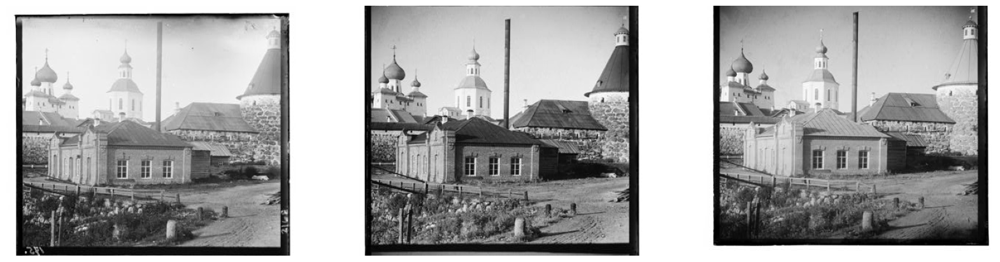

In [ ]:

blue,green,red=crop_bgr_from_img('00351v.jpg')

# Display three color channel images
plt.figure(figsize=(20,20))
for i,img_arr in enumerate([blue,green,red]):
    img=Image.fromarray(img_arr)
    plt.subplot(1,3,i+1)
    plt.axis('off')
    plt.imshow(img,cmap='gray')

b)** &ensp; **Basic alignment [10 pts].** Now that we've divided the image into three channels, the next thing to do is to align two of the channels to the third. The easiest way to align the parts is to exhaustively search over a window of possible displacements (say [-15,15] pixels independently for the x and y axis), score each one using some image matching metric, and take the displacement with the best score. We can use normalized cross-correlation (NCC) as the image matching metric, which is simply the dot product between the two images normalized to have zero mean and unit norm.

In [ ]:
def ncc(img_a: np.array,img_b: np.array)->float:
    """
     Compute the normalized cross-correlation between two color channel images
     and return the matching score.

     :param img_a: the first image, which is a 341x396 numpy array.
     :param img_b: the second image, which is a 341x396 numpy array.

     :return: the normalized cross-correlation score.
    """


    ncc=0

    # ADD YOUR CODE HERE (5 pts)

    return ncc

Then, we align two color channel images by exhaustively searching over a window of possible displacements, score each one using NCC, and take the displacement with the best score. (Hint: you can use np.roll function to shift the entire image by the specified displacement.

In [ ]:
def align_imga_to_imgb(img_a:np.array,img_b:np.array, wd_size:int=15)->(np.array,(int,int)):
    """
     Align two color channel images. Return the aligned image_a and its displacement.

     :param img_a: the image to be shifted, which is a 341x396 numpy array.
     :param img_b: the image that is fixed, which is a 341x396 numpy array.

     :return: a tuple of (aligned_a, displacement_of_a). ''aligned_a'' is the aligned image_a,
     which is a 341x396 numpy array.''displacement_of_a'' is the displacement vector of img_a, which is
     a tuple of (row displacement, column displacement).
    """

    # Initialize the image matching score.
    score=0

    # Initialize the aligned image A.
    aligned_a=None

    #Initialize the displacement vector.
    displacement=(0,0)

    # Shift image A whithin range [-wd_size, wd_size], score each shifted image
    # and take the one with the best score.
    for i in range(-wd_size,wd_size):
        for j in range(-wd_size,wd_size):
            # Shift img_a's rows by i pixels, columns by j pixels
            shifted_a= # ADD YOUR CODE HERE (5 pts)

            new_score=ncc(shifted_a,img_b)

            if new_score>score:
                score=new_score
                aligned_a=shifted_a
                displacement=[i,j]
    return  aligned_a,displacement

Finally, we can display the colorized output and the (x,y) displacement vector that were used to align the channels.

Displacement of aligning the red channel to the green channel: [9, 0]
Displacement of aligning the green channel to the green channel: (0, 0)
Displacement of aligning the blue channel to the green channel: [-4, 0]


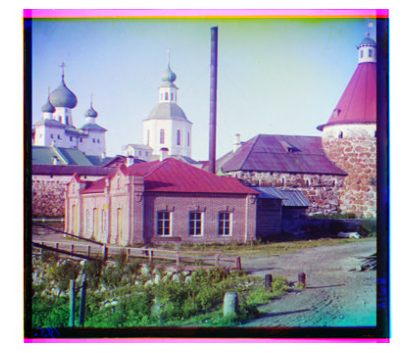

In [ ]:
def colorize_image(b:np.array,g:np.array,r:np.array)->(np.array,list):
    """
     Align the three color channel images. Return the colored image
     and a list of the displacement vector for each channel.

     :param b: the blue channel image, which is a 341x396 numpy array.
     :param g: the greeb channel image, which is a 341x396 numpy array.
     :param r: the red channel image, which is a 341x396 numpy array.

     :return: a tuple of (colored_image, displacements). ''colored_image'' is a 341x396x3 numpy array.
     ''displacements'' is a list of the displacement vector for each channel.
    """

    # Align the red and blue channels to the green channel.
    aligned_r,dis_r = align_imga_to_imgb(r,g)
    aligned_b,dis_b = align_imga_to_imgb(b,g)

    aligned_g,dis_g=g,(0,0)

    # Combine the aligned channels to a color image.
    colored_img=np.stack([aligned_r,aligned_g,aligned_b],axis=2)

    return colored_img,[dis_r,dis_g,dis_b]

colored_img,displacements=colorize_image(blue,green,red)
print('Displacement of aligning the red channel to the green channel:',displacements[0])
print('Displacement of aligning the green channel to the green channel:',displacements[1])
print('Displacement of aligning the blue channel to the green channel:',displacements[2])
plt.figure(figsize=(5,5))
plt.axis('off')
plt.imshow(colored_img)

**c)** &ensp; **Multiscale alignment [15 pts].** Now let's try colorizing the high-resolution image [01047u.tif](https://drive.google.com/file/d/1HbmTOLAw_f64wurxJyorOraKGX6EIree/view?usp=sharing). This image is of size 9656 x 3741. Therefore, exhaustive search over all possible displacements will become prohibitively expensive. To deal with this case, we can implement a faster search procedure using an image pyramid. An image pyramid represents the image at multiple scales (usually scaled by a factor of 2) and the processing is done sequentially starting from the coarsest scale (smallest image) and going down the pyramid, updating your estimate as you go. It is very easy to implement by adding recursive calls to your original single-scale implementation. The running time of your implementation should be less than 1 minute.

In [ ]:
def colorize_image_recursively(b:np.array,g:np.array,r:np.array)->(np.array,list):
    """
     Align the high-resolution three color channel images. Return the colored image
     and a list of the displacement vector for each channel.

     :param b: the high-resolution blue channel image, which is a 3218x3741 numpy array.
     :param g: the high-resolution greeb channel image, which is a 3218x3741 numpy array.
     :param r: the high-resolution red channel image, which is a 3218x3741 numpy array.

     :return: a tuple of (colored_image, displacements). ''colored_image'' is a 3218x3741x3 numpy array.
     ''displacements'' is a list of the displacement vector for each channel.
    """
    colored_img=None
    displacements=[]

    # ADD YOUR CODE HERE (15 pts)


    return colored_img,displacements


Displacement of aligning the red channel to the green channel: [96  0]
Displacement of aligning the green channel to the green channel: [0 0]
Displacement of aligning the blue channel to the green channel: [-32   0]


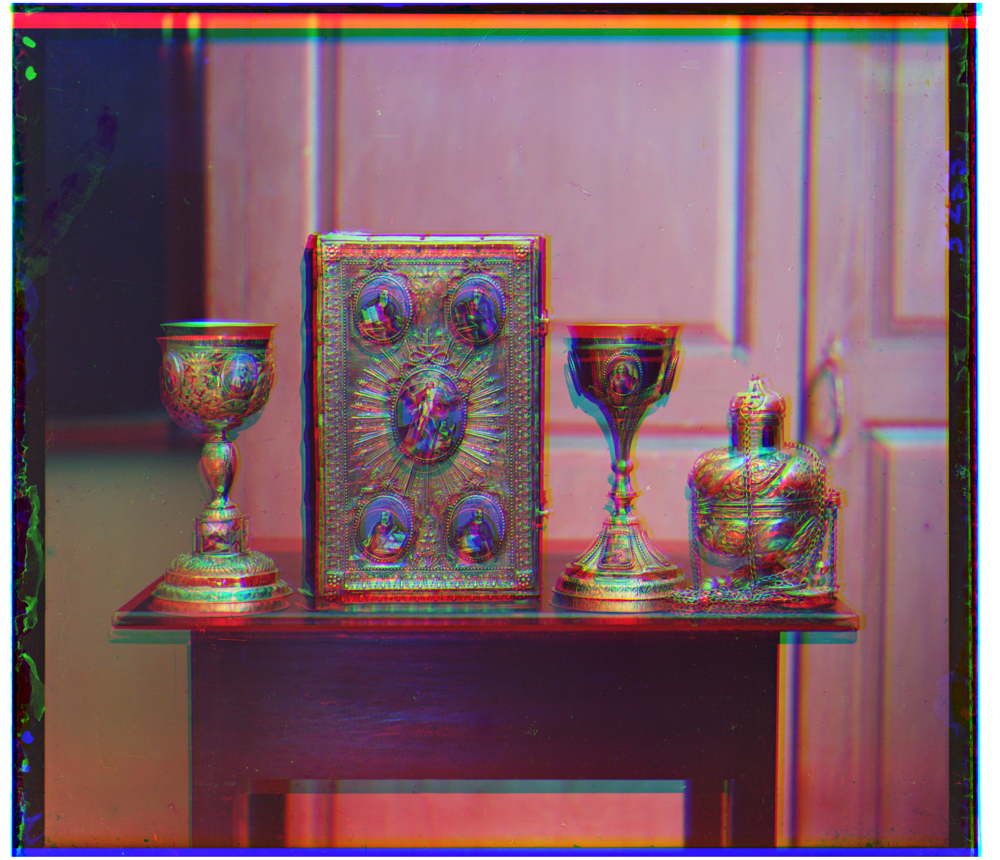

In [ ]:
blue,green,red=crop_bgr_from_img('01047u.tif')
hrs_colored_img,hrs_displacements=colorize_image_recursively(blue,green,red)
print('Displacement of aligning the red channel to the green channel:',hrs_displacements[0])
print('Displacement of aligning the green channel to the green channel:',hrs_displacements[1])
print('Displacement of aligning the blue channel to the green channel:',hrs_displacements[2])
plt.figure(figsize=(40,40))
plt.axis('off')
plt.imshow(hrs_colored_img)

**d)** &ensp; **Improve the alignment [5 bonus pts].** The borders of the photograph will have strange colors since the three channels won't exactly align. See if you can devise an automatic way of cropping the border to get rid of the bad stuff. One possible idea is that the information in the good parts of the image generally agrees across the color channels, whereas at borders it does not.

In [ ]:
def crop_border(img:np.array)->np.array:
    """
     Crop the border to get rid of strange colors in the image.

     :param img: the colorized image, which is a 341x396x3 numpy array.
     :return: the improved image, which is a HxWx3 numpy array.

    """
    new_img=None

    # ADD YOUR CODE HERE

    return new_img


In [ ]:
new_img=crop_border(colored_img)
plt.figure(figsize=(5,5))
plt.axis('off')
plt.imshow(new_img)